<a href="https://colab.research.google.com/github/dlora2024/Prob-Stat/blob/main/Final_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Final Project Notebook - Spring 2024

In [1]:
#Imports Libraries to be able to run certain commands
import matplotlib.pyplot as plt
import imageio
import torch
import torchvision
from torchvision import models, transforms
import numpy as np
from torchvision.models import *
from PIL import Image
import requests
from torchvision import models
from torchsummary import summary

In [2]:
#    Plots a given image.

    #Parameters:
    #x (numpy.ndarray): Input image as a NumPy array.

def plot(x):
    fig, ax = plt.subplots()#This line creates a new figure and an axes object within it.
    im = ax.imshow(x,cmap='gray')#This line displays the image x on the axes object ax. The cmap='gray' argument specifies that the image should be displayed in grayscale.
    ax.axis('off')#This line removes the axes ticks and labels from the plot.
    fig.set_size_inches(20, 20)#This line sets the size of the figure to 20 inches by 20 inches.
    plt.show()#This line displays the plot

In [3]:
im = imageio.imread('https://raw.githubusercontent.com/imageio/imageio-binaries/master/images/imageio_banner.png')#This function reads an image from a file or URL and returns it as a NumPy array.

<ipython-input-3-88bed6277ea3>:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  im = imageio.imread('https://raw.githubusercontent.com/imageio/imageio-binaries/master/images/imageio_banner.png')#This function reads an image from a file or URL and returns it as a NumPy array.


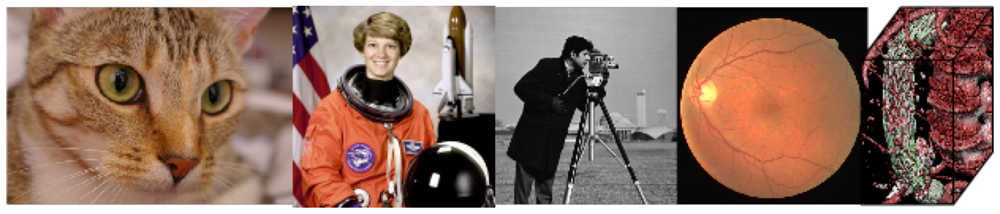

In [4]:
plot(im)#Plot Im

In [5]:
net = alexnet(pretrained=True).cuda(0)#This line loads the AlexNet model from torchvision. The pretrained=True argument specifies that the model should be loaded with pre-trained weights. #.cuda(0): This line transfers the model to the GPU device with ID 0.

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth
100%|██████████| 233M/233M [00:05<00:00, 47.7MB/s]


In [6]:
#The normalize object is used to normalize the image tensors using the specified mean and standard deviation values. This helps to improve the model's performance by ensuring that the input data has a consistent distribution
normalize = transforms.Normalize(
   mean=[0.485, 0.456, 0.406],
   std=[0.229, 0.224, 0.225]
)
preprocess = transforms.Compose([
   transforms.Resize(256),
   transforms.CenterCrop(224),
   transforms.ToTensor(),
   normalize
])

# This code defines a set of transformations to be applied to images before they are fed into the AlexNet model.

In [7]:
im = imageio.imread('https://www.medicalnewstoday.com/content/images/articles/322/322868/golden-retriever-puppy.jpg')# This function reads an image from a file or URL and returns it as a NumPy array.

<ipython-input-7-7e4af5eefe7b>:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  im = imageio.imread('https://www.medicalnewstoday.com/content/images/articles/322/322868/golden-retriever-puppy.jpg')# This function reads an image from a file or URL and returns it as a NumPy array.


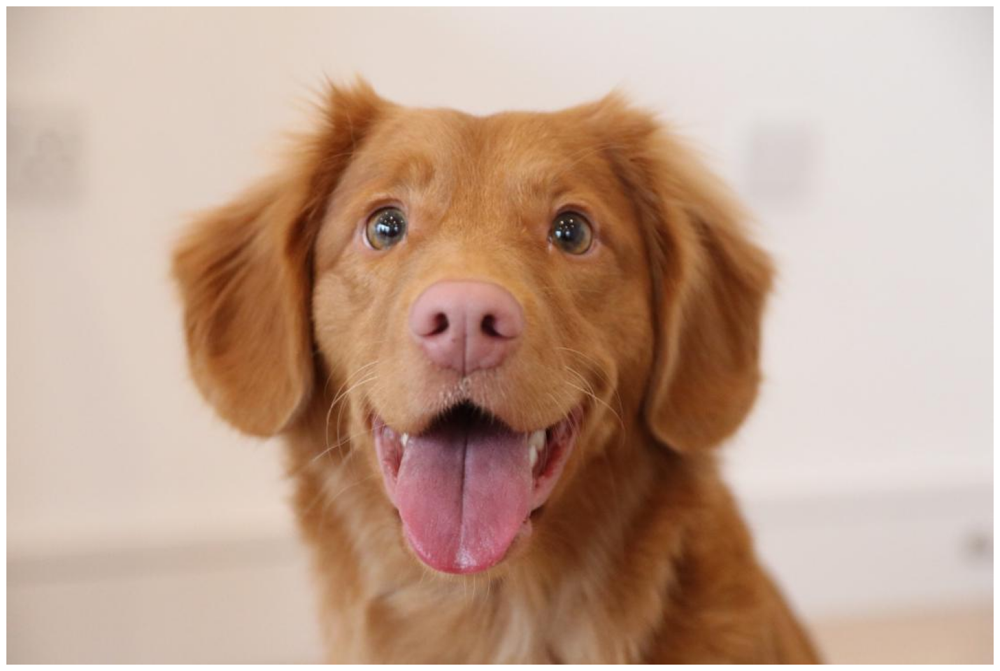

In [8]:
plot(im)#Plot Im

In [9]:
image = Image.fromarray(im) #This function converts a NumPy array into a PIL Image object.

In [10]:
img_tensor = preprocess(image)#This code applies the transformations defined in the `preprocess` object to the PIL Image `image` and stores the resulting tensor in the variable `img_tensor`

In [11]:
img_tensor = img_tensor.unsqueeze_(0)#This code adds a new dimension to the beginning of the `img_tensor` tensor.

In [12]:
img_tensor.shape#This code prints the shape of the `img_tensor` tensor.

torch.Size([1, 3, 224, 224])

In [13]:
img_variable = torch.tensor(img_tensor).cuda(0)#This code converts the `img_tensor` tensor to a PyTorch variable and transfers it to the GPU device with ID 0.

<ipython-input-13-106d012c7404>:1: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img_variable = torch.tensor(img_tensor).cuda(0)#This code converts the `img_tensor` tensor to a PyTorch variable and transfers it to the GPU device with ID 0.


In [14]:
out = net(img_variable)#This code applies the AlexNet model `net` to the input image `img_variable` and stores the output in the variable `out`.

In [15]:
label_index = out.cpu().data.numpy().argmax()
#out.cpu(): This line transfers the out tensor from the GPU to the CPU.
#out.data: This line accesses the data of the out tensor as a NumPy array.
#numpy().argmax(): This line finds the index of the maximum value in the NumPy array.

In [16]:
label_index#This code prints the value of the `label_index` variable.

220

In [17]:
top_list = np.flip(np.argsort(out.cpu().data.numpy())[0][-10:])
#out.cpu().data.numpy(): This line converts the out tensor to a NumPy array on the CPU.
#np.argsort: This function sorts the elements of the NumPy array and returns the indices of the sorted elements.

In [18]:
LABELS_URL = 'https://s3.amazonaws.com/mlpipes/pytorch-quick-start/labels.json'## This code defines a constant variable `LABELS_URL` that contains the URL of a JSON file containing the class labels for the AlexNet model.

In [19]:
labels = {int(key):value for (key, value) in requests.get(LABELS_URL).json().items()}
#requests.get(LABELS_URL): This line sends a GET request to the URL LABELS_URL and retrieves the JSON response.
#.json(): This method converts the JSON response to a Python dictionary.
#{int(key):value for (key, value) in ...}: This line uses a dictionary comprehension to create a new dictionary that maps class indices (converted to integers) to class labels.

In [20]:
print(labels[label_index])#This code prints the class label for the top predicted class.

Sussex spaniel


In [21]:
for i in range(10):
    print(labels[top_list[i]])
#range(10): This creates a range of indices from 0 to 9, inclusive.
#for i in range(10): This loop iterates over the range of indices.
#labels[top_list[i]]: This line looks up the class label for the class index top_list[i] in the labels dictionary.
#print: This function prints the class label to the console.

Sussex spaniel
golden retriever
Irish setter, red setter
Brittany spaniel
tennis ball
Tibetan mastiff
cocker spaniel, English cocker spaniel, cocker
vizsla, Hungarian pointer
clumber, clumber spaniel
Labrador retriever


In [22]:
net
#The net variable is assumed to contain an instance of the AlexNet model from torchvision.
#When the net variable is printed, Python will call the __repr__ method of the AlexNet object, which will return a string representation of the model.
#This string representation will include information about the model's architecture, parameters, and current state.

AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (classifier): Sequential(
    (0): Dropout(p=0.5, inplace=False)
    (1): Linear(in_features=9216, out_features=4096, bias=True)
 

In [23]:
summary(net, (3, 224, 224))
#summary(net, (3, 224, 224)): This line calls the summary function from the torchsummary library to print a summary of the net model.
#The second argument to the summary function is a tuple that specifies the input shape of the model.
#The output of the summary function will be a table that shows the following information for each layer in the model:
#Layer type
#Number of input channels
#Number of output channels
#Kernel size
#Stride
#Padding
#Number of parameters

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 55, 55]          23,296
              ReLU-2           [-1, 64, 55, 55]               0
         MaxPool2d-3           [-1, 64, 27, 27]               0
            Conv2d-4          [-1, 192, 27, 27]         307,392
              ReLU-5          [-1, 192, 27, 27]               0
         MaxPool2d-6          [-1, 192, 13, 13]               0
            Conv2d-7          [-1, 384, 13, 13]         663,936
              ReLU-8          [-1, 384, 13, 13]               0
            Conv2d-9          [-1, 256, 13, 13]         884,992
             ReLU-10          [-1, 256, 13, 13]               0
           Conv2d-11          [-1, 256, 13, 13]         590,080
             ReLU-12          [-1, 256, 13, 13]               0
        MaxPool2d-13            [-1, 256, 6, 6]               0
AdaptiveAvgPool2d-14            [-1, 25

In [24]:
out = net.features[0](img_variable).cpu().detach().numpy()#This code applies the first layer of the AlexNet model to the input image and extracts the output as a NumPy array.

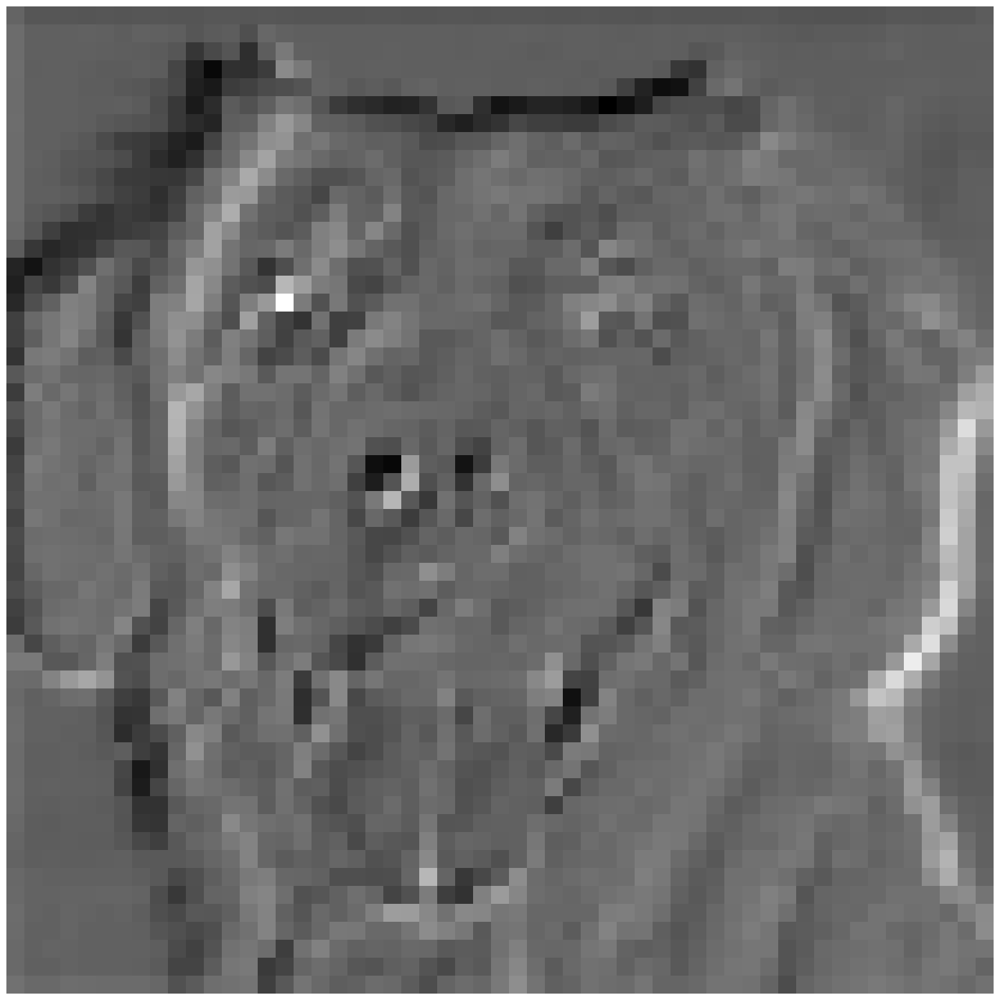

In [25]:
plot(out[0,0,:,:])
#out[0,0,:,:]: This expression selects the first feature map (channel 0) of the first layer (index 0) of the output tensor out.
#plot(out[0,0,:,:]): This line calls the plot function defined earlier to display the feature map as an image.

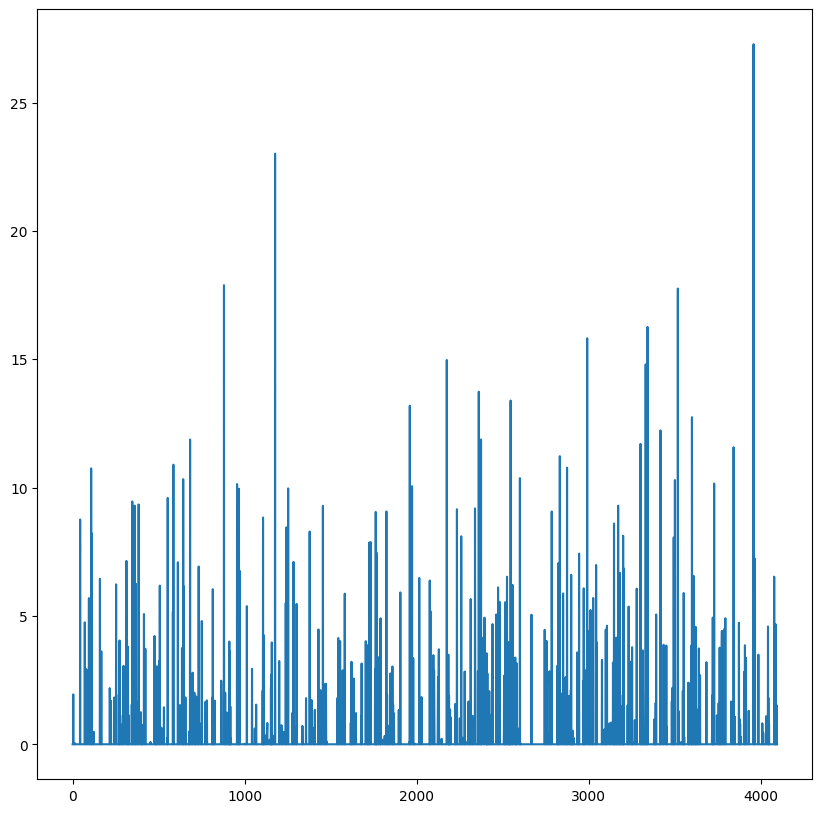

In [26]:
plt.plot(np.arange(4096),net.classifier[0:6](net.avgpool(net.features[0:13](img_variable)).flatten()).cpu().detach().numpy())
fig = plt.gcf()
fig.set_size_inches(10, 10)
#np.arange(4096): This creates an array of indices from 0 to 4095.
#net.classifier[0:6](net.avgpool(net.features[0:13](img_variable)).flatten()): This expression applies the first six layers of the AlexNet model's classifier to the flattened output of the first 13 layers of the model.
#.cpu().detach().numpy(): This converts the output tensor to a NumPy array on the CPU.
#plt.plot: This function plots the NumPy array as a line chart.


In [27]:
im = imageio.imread('http://bocasurfcam.com/most_recent_image.php')#This code reads an image from the specified URL using the `imageio.imread` function and stores it in the variable `im`.

<ipython-input-27-4b579c52fc33>:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  im = imageio.imread('http://bocasurfcam.com/most_recent_image.php')#This code reads an image from the specified URL using the `imageio.imread` function and stores it in the variable `im`.


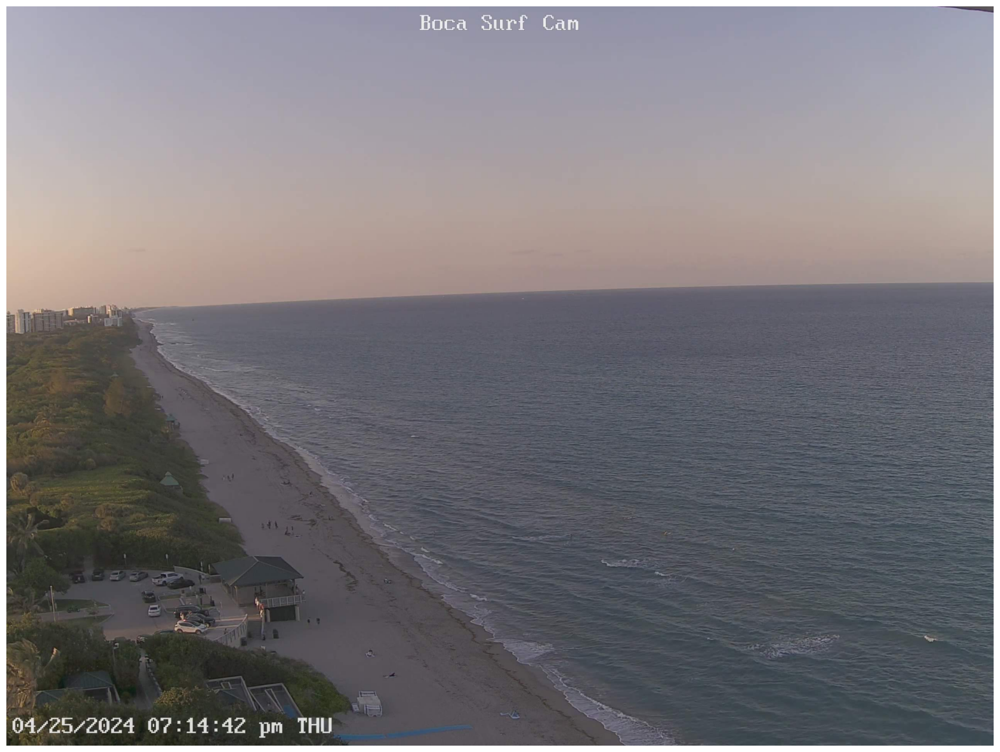

In [28]:
plot(im)#This code displays the image `im` using the `plot` function defined earlier.

In [29]:
 #Documentation Block
    #Converts a NumPy array image into a PyTorch tensor and transfers it to the GPU.

    #Parameters:
    #im (numpy.ndarray): Input image as a NumPy array.

    #Returns:

    #torch.Tensor: Tensor containing the image data, transferred to the GPU.
def load_im(im):
    image = Image.fromarray(im) #convert to pil
    img_tensor = preprocess(image)
    img_tensor = img_tensor.unsqueeze_(0)
    img_variable = torch.tensor(img_tensor).cuda(0)
    return img_variable
#The load_im function takes an image im as input.
#The function first converts the image to a PIL Image object using Image.fromarray.
#The PIL Image object is then passed to the preprocess function to apply the necessary transformations.
#The transformed image is then converted to a PyTorch tensor and unsqueezed to add a batch dimension.
#Finally, the tensor is transferred to the GPU and returned as a PyTorch variable.

In [30]:
out = net(load_im(im))#This code applies the AlexNet model `net` to the input image `im` using the `load_im` function and stores the output in the variable `out`.

<ipython-input-29-378b0871a300>:5: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img_variable = torch.tensor(img_tensor).cuda(0)


In [31]:
def inference(im):
    out = net(load_im(im))
    label_index = out.cpu().data.numpy().argmax()
    top_list = np.flip(np.argsort(out.cpu().data.numpy())[0][-10:])
    print(labels[label_index])
    print('____')
    for i in range(10):
        print(labels[top_list[i]])

#The inference function takes an image im as input.
#The function first calls the load_im function to convert the image to a PyTorch variable.
#The PyTorch variable is then passed to the AlexNet model net to obtain the output.
#The predicted class label is then extracted from the output using argmax and printed.
#The top 10 predicted class labels are then extracted from the output using argsort and printed.

In [32]:
inference(im)#The inference function will apply the AlexNet model to the input image im and print the top predicted class label and the top 10 predicted class labels.

promontory, headland, head, foreland
____
promontory, headland, head, foreland
wing
sandbar, sand bar
seashore, coast, seacoast, sea-coast
breakwater, groin, groyne, mole, bulwark, seawall, jetty
volcano
mountain tent
lakeside, lakeshore
valley, vale
fireboat


<ipython-input-29-378b0871a300>:5: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img_variable = torch.tensor(img_tensor).cuda(0)


# Restart Notebook (Disconnect and Delete Runtime) Before Running Next Section

# Custom Data Deck

In [33]:
# Install necessary packages
%%capture
!pip install wandb
!apt-get install poppler-utils
!pip install pdf2image
!pip install flashtorch
# Import necessary libraries
import requests
from pdf2image import convert_from_path
import matplotlib.pyplot as plt
import numpy as np
import torch
import requests
from torchvision import *
from torchvision.models import *
from flashtorch.utils import apply_transforms
import wandb as wb

In [34]:
def GPU(data):
    return torch.tensor(data, requires_grad=True, dtype=torch.float, device=torch.device('cuda'))

def GPU_data(data):
    return torch.tensor(data, requires_grad=False, dtype=torch.float, device=torch.device('cuda'))
#The GPU and GPU_data functions both take a data object as input.
#The GPU function creates a PyTorch tensor from the data and sets the requires_grad flag to True, indicating that the tensor can be used for gradient calculations.
#The GPU_data function creates a PyTorch tensor from the data and sets the requires_grad flag to False, indicating that the tensor cannot be used for gradient calculations.
#Both functions set the device of the tensor to torch.device('cuda'), which transfers the tensor to the GPU.

In [35]:
#Documentation Block

    #Plots a given image.

    #Parameters:
    #x (numpy.ndarray): Input image as a NumPy array.

def plot(x):
    fig, ax = plt.subplots()
    im = ax.imshow(x, cmap = 'gray')
    ax.axis('off')
    fig.set_size_inches(5, 5)
    plt.show()
#fig, ax = plt.subplots(): This line creates a new figure and an axes object within it.
#im = ax.imshow(x, cmap = 'gray'): This line displays the image x on the axes object ax. The cmap = 'gray' argument specifies that the image should be displayed in grayscale.
#ax.axis('off'): This line removes the axes ticks and labels from the plot.
#fig.set_size_inches(5, 5): This line sets the size of the figure to 5 inches by 5 inches.
#plt.show(): This line displays the plot.

In [36]:
#Documentation Block
 #Downloads a PDF file from a Google Slides presentation and converts it to a list of images.

   # Parameters:
    #url (str): URL of the Google Slides presentation.

    #Returns:
   #list: List of images extracted from the PDF file.

#These functions download a PDF file from a Google Slides presentation and convert it to a list of images.
def get_google_slide(url):
    url_head = "https://docs.google.com/presentation/d/"
    url_body = url.split('/')[5]
    page_id = url.split('.')[-1]
    return url_head + url_body + "/export/pdf?id=" + url_body + "&pageid=" + page_id

def get_slides(url):
    url = get_google_slide(url)
    r = requests.get(url, allow_redirects=True)
    open('file.pdf', 'wb').write(r.content)
    images = convert_from_path('file.pdf', 500)
    return images

#Documentation Block

    #Loads an image and applies necessary transformations.

    #Parameters:
    #image (PIL.Image.Image): Input image as a PIL Image object.

    #Returns:
    #torch.Tensor: Tensor containing the transformed image data.



def load(image):

    return apply_transforms(image).clone().detach().requires_grad_(True).to(device)

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
#The get_google_slide function takes a URL to a Google Slides presentation and returns a URL that can be used to download the presentation as a PDF file.
#The get_slides function takes a URL to a Google Slides presentation, downloads the presentation as a PDF file, and then converts the PDF file to a list of images using the convert_from_path function from the pdf2image library.



In [37]:
labels = {int(key):value for (key, value) in requests.get('https://s3.amazonaws.com/mlpipes/pytorch-quick-start/labels.json').json().items()}
#requests.get('https://s3.amazonaws.com/mlpipes/pytorch-quick-start/labels.json'): This line sends a GET request to the specified URL and retrieves the JSON response.
#.json(): This method converts the JSON response to a Python dictionary.
#{int(key):value for (key, value) in ...}: This line uses a dictionary comprehension to create a new dictionary that maps class indices (converted to integers) to class labels.

In [38]:
model = alexnet(weights='DEFAULT').to(device)
model.eval();
#alexnet(weights='DEFAULT'): This line loads the AlexNet model from the torchvision library with the default weights.
#.to(device): This line transfers the model to the GPU device specified by the device variable.
#model.eval(): This line sets the model to evaluation mode.

In [39]:
url = "https://docs.google.com/presentation/d/1O3Ote4L7y50i2C9AUUjF-hkpuQbJlj4i2f8o_05yxTs/edit#slide=id.g2b78f0cdd88_0_89"#Url from google docs

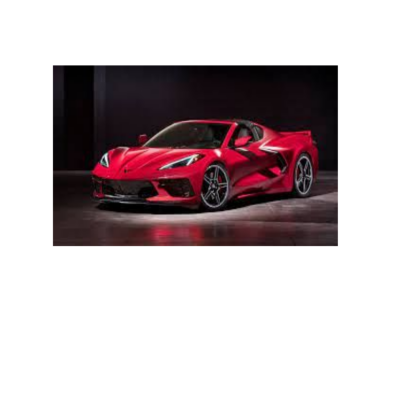

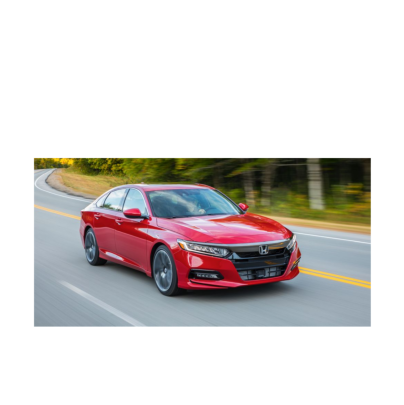

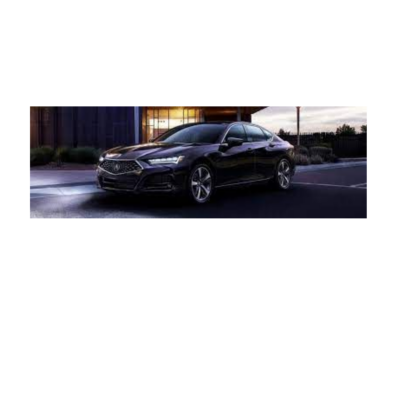

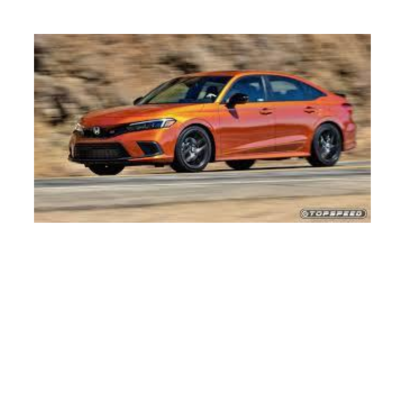

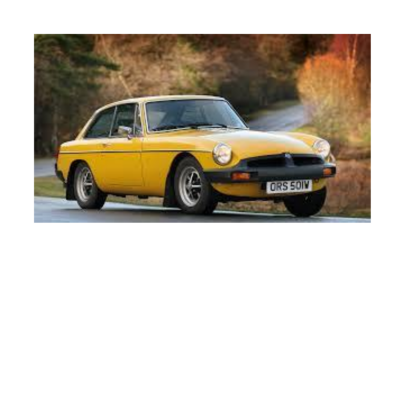

...

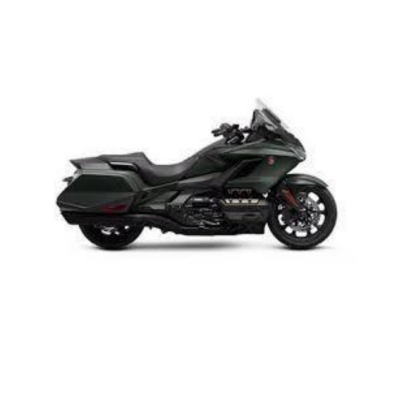

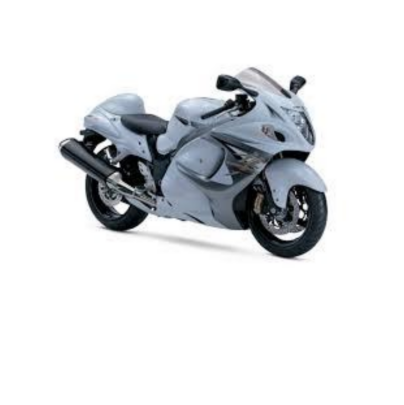

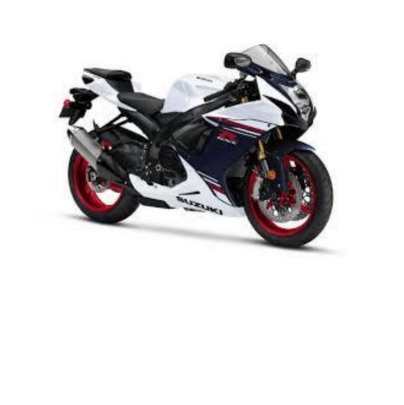

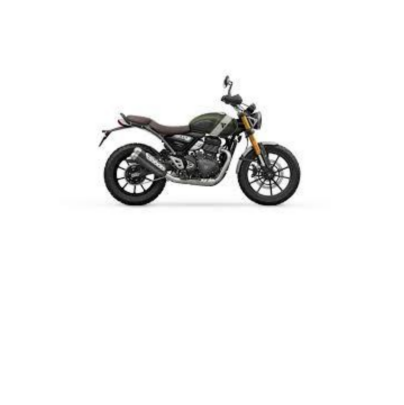

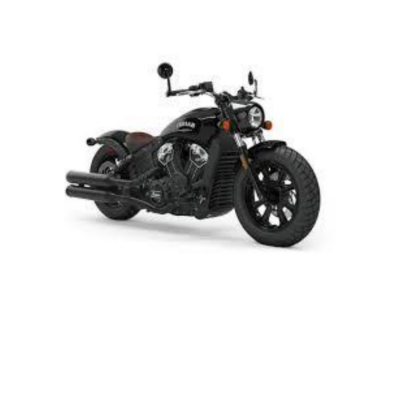

In [40]:
images = []

for image in get_slides(url):

    plot(image)

    images.append(load(image))

images = torch.vstack(images)
#images = []: This line initializes an empty list to store the PyTorch tensors.
#for image in get_slides(url):: This loop iterates over the list of images returned by the get_slides function.
#plot(image): This line displays the image using the plot function.
#images.append(load(image)): This line converts the image to a PyTorch tensor using the load function and appends it to the images list.
#images = torch.vstack(images): This line stacks the PyTorch tensors in the images list vertically into a single tensor.

In [41]:
images.shape#This code prints the shape of the `images` tensor.

torch.Size([50, 3, 224, 224])

In [42]:
model(images)
#model(images): This line applies the AlexNet model model to the input images images.
#The output of the model will be a tensor that contains the predicted class scores for each image.

tensor([[-3.6616, -1.8409, -5.1184,  ..., -3.7058,  0.0543,  2.1109],
        [-0.7229, -4.0792, -2.9716,  ..., -3.9750,  0.9954,  0.6362],
        [-1.0625, -3.9715, -3.1410,  ..., -5.4532, -1.4458,  0.4856],
        ...,
        [-3.6505, -3.1890, -4.1404,  ..., -7.3105, -0.5194,  5.2455],
        [-0.8595, -5.6035, -5.8905,  ..., -4.4493,  0.3467,  3.0084],
        [-0.5345, -1.9750, -4.7030,  ..., -3.0260,  0.7124,  0.0484]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

In [43]:
y = model(images)#This code applies the AlexNet model `model` to the input images `images` and stores the output in the variable `y`.

In [44]:
y.shape#This code prints the shape of the `y` tensor.

torch.Size([50, 1000])

In [45]:
guesses = torch.argmax(y, 1).cpu().numpy()
#torch.argmax(y, 1): This line uses the argmax function to find the index of the maximum value in each row of the y tensor. The 1 argument specifies that the maximum value should be found along the second dimension (columns) of the tensor. 2 .cpu(): This method transfers the tensor to the CPU. 3 .numpy(): This method converts the tensor to a NumPy array.

In [46]:
for i in list(guesses):
    print(labels[i])
#list(guesses): This converts the guesses NumPy array to a Python list.
#for i in list(guesses): This loop iterates over the list of predicted class indices.
#print(labels[i]): This line prints the class label for the current predicted class index i using the labels dictionary.

television, television system
racer, race car, racing car
snowplow, snowplough
sports car, sport car
sports car, sport car
go-kart
convertible
limousine, limo
go-kart
go-kart
cab, hack, taxi, taxicab
amphibian, amphibious vehicle
limousine, limo
half track
snowmobile
limousine, limo
sports car, sport car
convertible
go-kart
sports car, sport car
sports car, sport car
web site, website, internet site, site
sports car, sport car
convertible
cellular telephone, cellular phone, cellphone, cell, mobile phone
whistle
crash helmet
hair slide
moped
magnetic compass
hair slide
dial telephone, dial phone
hair slide
crash helmet
moped
magnetic compass
hair slide
gasmask, respirator, gas helmet
racer, race car, racing car
magnetic compass
magnetic compass
magnetic compass
hair slide
moped
magnetic compass
whistle
joystick
snowmobile
magnetic compass
reflex camera


In [47]:
Y = np.zeros(50,)
Y[25:] = 1
#np.zeros(50,): This line creates a NumPy array of length 50 with all elements initialized to 0.
#Y[25:] = 1: This line sets all elements of the array from index 25 (inclusive) to the end of the array to 1.

In [48]:
Y#Print Y

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.])

In [49]:
X = y.detach().cpu().numpy()## This code transfers the `y` tensor to the CPU, detaches it from the computation graph, and converts it to a NumPy array.

In [50]:
X.shape#X.shape: This line accesses the shape attribute of the X NumPy array, which returns a tuple that indicates the number of elements in each dimension of the array

(50, 1000)

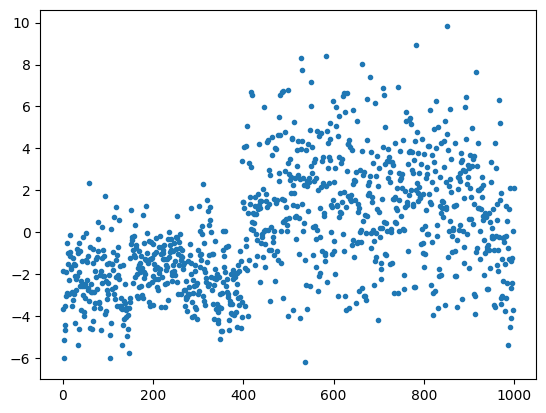

In [51]:
plt.plot(X[0],'.')
#X[0]: This expression selects the first row of the X NumPy array.
#plt.plot(X[0],'.'): This line uses the plot function from the matplotlib library to plot the first row of the X NumPy array as a line plot with dots.

In [52]:
X[0]#X[0]: This expression selects the first row of the X NumPy array.

array([-3.66162586e+00, -1.84094536e+00, -5.11844683e+00, -5.99449205e+00,
       -4.41474676e+00, -3.52276969e+00, -4.66231108e+00, -3.02351928e+00,
       -1.90753555e+00, -2.89583588e+00, -4.95241284e-01, -1.52547336e+00,
       -9.88379121e-01, -2.94145417e+00, -2.28543782e+00, -9.65872943e-01,
       -1.52091816e-01, -1.15238142e+00, -1.74589896e+00, -1.65217113e+00,
       -3.52990294e+00, -2.86615419e+00, -3.23014355e+00, -1.25027001e+00,
       -2.96817732e+00, -1.52358055e+00, -4.33322620e+00, -2.09740281e+00,
       -1.54240632e+00, -2.24969912e+00, -2.77867508e+00, -2.08032942e+00,
       -7.89419830e-01, -5.38675976e+00, -9.77076232e-01, -4.59905291e+00,
       -5.03391445e-01, -1.88133597e+00, -2.56539893e+00, -9.10843074e-01,
       -2.30637121e+00, -3.73201084e+00, -2.58365273e+00, -1.38971400e+00,
       -2.99053049e+00, -2.43428260e-01, -3.81397438e+00, -2.54806662e+00,
       -3.99469137e+00, -3.14099789e+00, -2.48833370e+00, -2.41985023e-02,
       -1.31881356e+00, -

In [53]:
np.argmax(X[0])
#X[0]: This expression selects the first row of the X NumPy array.
#np.argmax: This function finds the index of the maximum value in the specified array.

851

In [54]:
labels[948]#This expression looks up the class label for the class with index 948 in the labels dictionary.

'Granny Smith'

In [55]:
top_ten = np.argsort(X[0])[::-1][0:10]
#np.argsort(X[0]): This expression sorts the elements of the first row of the X NumPy array and returns the indices of the sorted elements. 2 [::-1]: This expression reverses the order of the indices.
#[0:10]: This expression selects the first 10 elements of the reversed indices.

In [56]:
for i in top_ten:
    print(labels[i])
#for i in top_ten: This loop iterates over the indices of the top 10 predicted classes stored in the top_ten variable.
#print(labels[i]): This line prints the class label for the current index i using the labels dictionary

television, television system
screen, CRT screen
hair slide
desktop computer
monitor
digital clock
web site, website, internet site, site
notebook, notebook computer
face powder
printer


In [57]:
labels#Prints Lables

{0: 'tench, Tinca tinca',
 1: 'goldfish, Carassius auratus',
 2: 'great white shark, white shark, man-eater, man-eating shark, Carcharodon carcharias',
 3: 'tiger shark, Galeocerdo cuvieri',
 4: 'hammerhead, hammerhead shark',
 5: 'electric ray, crampfish, numbfish, torpedo',
 6: 'stingray',
 7: 'cock',
 8: 'hen',
 9: 'ostrich, Struthio camelus',
 10: 'brambling, Fringilla montifringilla',
 11: 'goldfinch, Carduelis carduelis',
 12: 'house finch, linnet, Carpodacus mexicanus',
 13: 'junco, snowbird',
 14: 'indigo bunting, indigo finch, indigo bird, Passerina cyanea',
 15: 'robin, American robin, Turdus migratorius',
 16: 'bulbul',
 17: 'jay',
 18: 'magpie',
 19: 'chickadee',
 20: 'water ouzel, dipper',
 21: 'kite',
 22: 'bald eagle, American eagle, Haliaeetus leucocephalus',
 23: 'vulture',
 24: 'great grey owl, great gray owl, Strix nebulosa',
 25: 'European fire salamander, Salamandra salamandra',
 26: 'common newt, Triturus vulgaris',
 27: 'eft',
 28: 'spotted salamander, Ambystoma 

(array([ 18., 126., 211., 228., 157., 129.,  80.,  34.,  13.,   4.]),
 array([-6.21462536, -4.61131907, -3.00801277, -1.40470648,  0.19859982,
         1.80190611,  3.4052124 ,  5.0085187 ,  6.61182499,  8.21513176,
         9.81843758]),
 <BarContainer object of 10 artists>)

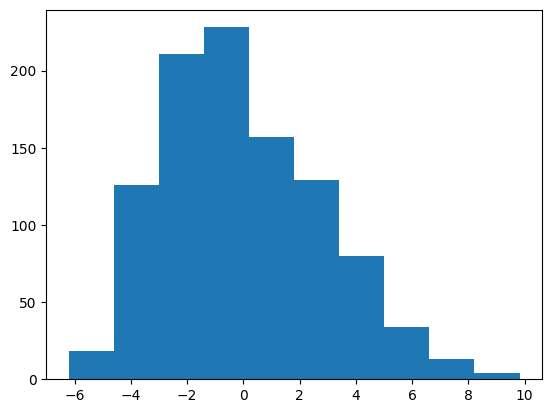

In [58]:
plt.hist(X[0])
#X[0]: This expression selects the first row of the X NumPy array.
#plt.hist(X[0]): This line uses the hist function from the matplotlib library to create a histogram of the values in the first row of the X NumPy array.

In [59]:
X = GPU_data(X)
Y = GPU_data(Y)
#GPU_data: This function converts the input data to a PyTorch tensor and transfers it to the GPU.
#X = GPU_data(X): This line transfers the X NumPy array to the GPU.
#Y = GPU_data(Y): This line transfers the Y NumPy array to the GPU.

In [60]:
def softmax(x):
    s1 = torch.exp(x - torch.max(x,1)[0][:,None])
    s = s1 / s1.sum(1)[:,None]
    return s
#torch.exp(x - torch.max(x,1)[0][:,None]): This line computes the exponential of each element in the input tensor x, normalized by the maximum value in each row.
#s1 / s1.sum(1)[:,None]: This line divides each element in the normalized exponential tensor by the sum of all elements in the corresponding row, to ensure that the resulting values sum to 1.
#return s: This line returns the softmax tensor.

In [61]:
def cross_entropy(outputs, labels):
    return -torch.sum(softmax(outputs).log()[range(outputs.size()[0]), labels.long()])/outputs.size()[0]
#softmax(outputs): This line computes the softmax function for the model outputs.
#softmax(outputs).log(): This line computes the logarithm of the softmax probabilities.
#range(outputs.size()[0]): This generates a range of indices corresponding to the number of samples in the batch.
#labels.long(): This converts the target labels to a LongTensor.
#softmax(outputs).log()[range(outputs.size()[0]), labels.long()]: This selects the log-probabilities of the correct classes for each sample in the batch.
#-torch.sum(...)/outputs.size()[0]: This computes the negative mean of the selected log-probabilities.

In [62]:
def Truncated_Normal(size):

    u1 = torch.rand(size)*(1-np.exp(-2)) + np.exp(-2)
    u2 = torch.rand(size)
    z  = torch.sqrt(-2*torch.log(u1)) * torch.cos(2*np.pi*u2)

    return z

#torch.rand(size): This generates random numbers from a uniform distribution between 0 and 1.
#(1-np.exp(-2)) + np.exp(-2): This defines the lower bound of the truncated normal distribution.
#torch.sqrt(-2*torch.log(u1)): This computes the square root of the negative logarithm of the random numbers.
#torch.cos(2*np.pi*u2): This computes the cosine of the random numbers multiplied by 2π.
#z: This variable stores the generated truncated normal random numbers.

In [63]:
def acc(out,y):
    with torch.no_grad():
        return (torch.sum(torch.max(out,1)[1] == y).item())/y.shape[0]
#torch.no_grad(): This context manager disables gradient computation, which is not necessary for calculating accuracy.
#torch.max(out,1)[1]: This finds the index of the maximum value in each row of the output tensor out.
#== y: This compares the predicted class indices to the true labels y.
#torch.sum(...).item(): This sums the number of correct predictions and converts the result to a Python float.
#y.shape[0]: This gets the number of samples in the batch.
#/y.shape[0]: This divides the number of correct predictions by the number of samples to get the accuracy.

In [64]:
X.shape#This code prints the shape of the `X` tensor.

torch.Size([50, 1000])

In [65]:
def get_batch(mode):
    b = c.b
    if mode == "train":
        r = np.random.randint(X.shape[0]-b)
        x = X[r:r+b,:]
        y = Y[r:r+b]
    elif mode == "test":
        r = np.random.randint(X_test.shape[0]-b)
        x = X_test[r:r+b,:]
        y = Y_test[r:r+b]
    return x,y
#b = c.b: This line retrieves the batch size from the c object.
#if mode == "train":: This block of code is executed if the mode argument is "train".
#r = np.random.randint(X.shape[0]-b): This line generates a random starting index for the batch, ensuring that there are enough remaining elements in the X tensor.
#x = X[r:r+b,:]: This line selects a batch of data from the X tensor.
#y = Y[r:r+b]: This line selects the corresponding batch of labels from the Y tensor.
#elif mode == "test":: This block of code is executed if the mode argument is "test".
#r = np.random.randint(X_test.shape[0]-b): This line generates a random starting index for the batch, ensuring that there are enough remaining elements in the X_test tensor.
#x = X_test[r:r+b,:]: This line selects a batch of data from the X_test tensor.
#y = Y_test[r:r+b]: This line selects the corresponding batch of labels from the Y_test tensor.
#return x,y: This line returns the batch of data and labels.

In [66]:
def model(x,w):

    return x@w[0]
#x@w[0]: This line performs matrix multiplication between the input data x and the first element of the weight matrix w

In [67]:
def make_plots():

    acc_train = acc(model(x,w),y)

    wb.log({"acc_train": acc_train})
#acc_train = acc(model(x,w),y): This line calculates the training accuracy by applying the model function to the input data x and weight matrix w, and then passing the result to the acc function along with the true labels y.
#wb.log({"acc_train": acc_train}): This line logs the training accuracy to Weights & Biases using the wb.log function

In [68]:
wb.init(project="Linear_Model_Photo_1");
c = wb.config

c.h = 0.001
c.b = 4
c.epochs = 100000

w = [GPU(Truncated_Normal((1000,2)))]

optimizer = torch.optim.Adam(w, lr=c.h)

for i in range(c.epochs):

    x,y = get_batch('train')

    loss = cross_entropy(softmax(model(x,w)),y)

    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    wb.log({"loss": loss})

    make_plots()


#wb.init(project="Linear_Model_Photo_1"): This line initializes the Weights & Biases logger with the project name "Linear_Model_Photo_1".
#c = wb.config: This line retrieves the configuration object from Weights & Biases.
#c.h = 0.001: This line sets the learning rate for the optimizer.
#c.b = 4: This line sets the batch size.
#c.epochs = 100000: This line sets the number of training epochs.
#w = [GPU(Truncated_Normal((1000,2)))]: This line initializes the model parameters as a list containing a single weight matrix with dimensions 1000x2, and transfers it to the GPU.
#optimizer = torch.optim.Adam(w, lr=c.h): This line creates an Adam optimizer to update the model parameters.
#for i in range(c.epochs): This loop iterates over the training epochs.
#x,y = get_batch('train'): This line retrieves a batch of training data.
#loss = cross_entropy(softmax(model(x,w)),y): This line calculates the cross-entropy loss between the model output and the true labels.
#optimizer.zero_grad(): This line clears the

<IPython.core.display.Javascript object>

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

 ··········


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


<ipython-input-34-97d3172a3636>:2: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor(data, requires_grad=True, dtype=torch.float, device=torch.device('cuda'))


In [1]:
import matplotlib.pyplot as plt

def make_plots():
    acc_train = acc(model(x,w),y)
    plt.figure()
    plt.plot(np.arange(len(loss_list)), loss_list, label='Training Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Training Loss over Epochs')
    plt.legend()
    plt.savefig('training_loss.png')  # Save the plot
    plt.close()

    wb.log({"acc_train": acc_train, "loss": loss.item(), "epoch": i})
    wb.log({"Training Loss": plt.figure()})  # Log the training loss plot

    return acc_train